<a href="https://colab.research.google.com/github/inahre/sketch_to_reality/blob/main/controlnet_implementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title installs

!pip install diffusers
!pip install Pillow
!pip install transformers
!pip install opencv-python
!pip install tqdm
!pip install -qq accelerate
!pip install -qq bitsandbytes
!pip install huggingface_hub
!pip install pandas

In [ ]:
#@title imports

import os
import PIL
from PIL import Image, ImageOps
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
import cv2  # For edge map creation
from torch.utils.data import DataLoader, Dataset
from diffusers import DiffusionPipeline, ControlNetModel, StableDiffusionControlNetPipeline
from accelerate import Accelerator
from tqdm.auto import tqdm
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer


#from https://colab.research.google.com/drive/1muBY-yFCu_jAxnxeNW0RGwwNQhWQsE24?usp=sharing#scrollTo=zywt5VQ30O3i

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [ ]:
#@title mount google drive

drive.mount('/content/gdrive') #to get access to google drive content

Mounted at /content/gdrive


In [ ]:
#@title ControlNet implementation
#edge-mapping images for controlnet

#image folders
input_folder = '/content/gdrive/MyDrive/Thesis_Project/data/no_flipped_sketches/'
output_folder = '/content/gdrive/MyDrive/Thesis_Project/data/designer_edge_maps/'

# supported image file types
supported_formats = ['.jpg', '.jpeg', '.png']

# Loop through all files in the input folder
for filename in os.listdir(input_folder):
        image_path = os.path.join(input_folder, filename)

        #read image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Skipping file {filename}: unable to read image.")
            continue

        #convert to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # gaussian blur
        blurred = cv2.GaussianBlur(gray, (3, 3), 0)

        # apply canny edge detection
        canny = cv2.Canny(blurred, 50, 255, 1)

        # filename for canny edge map output
        base_filename = os.path.splitext(filename)[0]
        output_path = os.path.join(output_folder, base_filename + '_.png')

        #save
        cv2.imwrite(output_path, canny)

        print(f"Processed and saved edge map for: {filename}")

print("All images processed and edge maps generated.")

#source: https://stackoverflow.com/questions/56736043/extract-building-edges-from-map-image-using-python/56743344#56743344


Processed and saved edge map for: trge_004.png
Processed and saved edge map for: trge_005.png
Processed and saved edge map for: trge_010.png
Processed and saved edge map for: trge_020.png
Processed and saved edge map for: trge_008.png
Processed and saved edge map for: trge_027.png
Processed and saved edge map for: trge_025.png
Processed and saved edge map for: trge_009.png
Processed and saved edge map for: trge_023.png
Processed and saved edge map for: trge_021.png
Processed and saved edge map for: trge_011.png
Processed and saved edge map for: trge_019.png
Processed and saved edge map for: trge_018.png
Processed and saved edge map for: trge_024.png
Processed and saved edge map for: trge_022.png
Processed and saved edge map for: trge_026.png
Processed and saved edge map for: trge_006.png
Processed and saved edge map for: trge_012.png
Processed and saved edge map for: trge_013.png
Processed and saved edge map for: trge_007.png
Processed and saved edge map for: trge_003.png
Processed and

In [ ]:

#edge-mapping some generated (not original) sketches for controlnet

# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Loop through all files in the input folder
for filename in os.listdir(input_folder):
        image_path = os.path.join(input_folder, filename)

        #read image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Skipping file {filename}: unable to read image.")
            continue

        #convert to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # gaussian blur
        blurred = cv2.GaussianBlur(gray, (3, 3), 0)

        # apply canny edge detection
        canny = cv2.Canny(blurred, 50, 255, 1)

        # filename for canny edge map output
        base_filename = os.path.splitext(filename)[0]
        output_path = os.path.join(output_folder, base_filename + '_.png')

        #save
        cv2.imwrite(output_path, canny)

        print(f"Processed and saved edge map for: {filename}")

print("All images processed and edge maps generated.")


Processed and saved edge map for: gen_001.png
Processed and saved edge map for: gen_002.png
Processed and saved edge map for: gen_003.png
Processed and saved edge map for: gen_004.png
Processed and saved edge map for: gen_005.png
Processed and saved edge map for: gen_006.png
Processed and saved edge map for: gen_007.png
All images processed and edge maps generated.


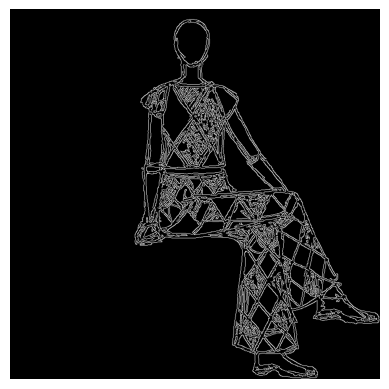

In [ ]:
from PIL import Image

# Load the edge map (black and white)

# Load the edge map (ensure it's RGB)
edge_map_path = "/content/gdrive/MyDrive/Thesis_Project/data/designer_edge_maps/trge_029_.png"
edge_map = Image.open(edge_map_path).convert("RGB")  # Convert the image to RGB

plt.imshow(edge_map)
plt.axis("off")
plt.show()

In [ ]:
# Load ControlNet Scribble
controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-scribble", torch_dtype=torch.float16)

#source: https://huggingface.co/docs/diffusers/api/pipelines/controlnet

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

In [ ]:
# Load ControlNet Canny
controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)

#source: https://huggingface.co/docs/diffusers/api/pipelines/controlnet

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

In [ ]:
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    model_path, controlnet=controlnet, torch_dtype=torch.float16
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

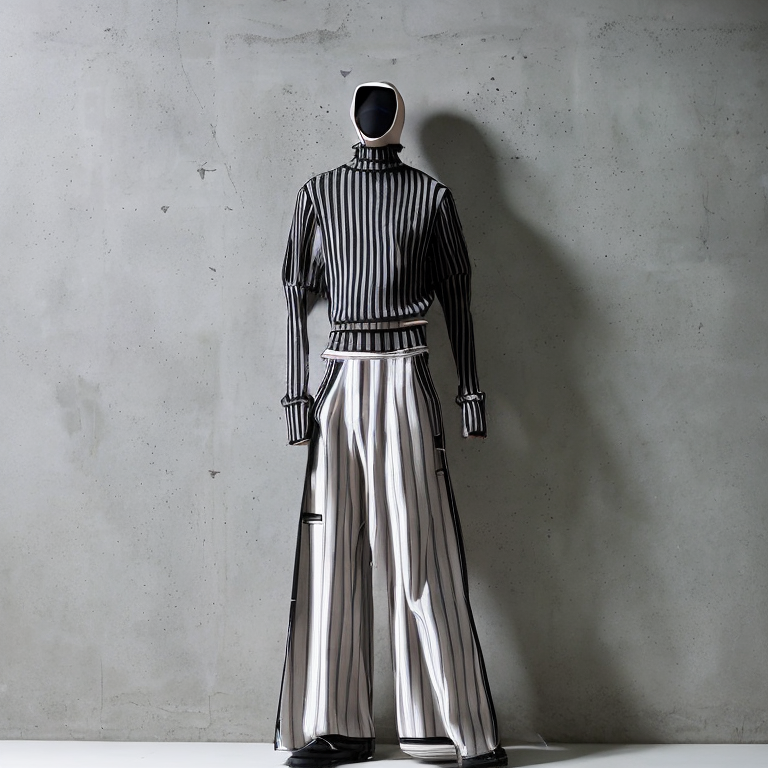

In [ ]:
#this was ControlNet Canny

prompt = "urban concrete, structured stiff jumper with t-shirt underneath and striped wide-legged trousers, loose turtle neck, long sleeves" #@param {type:"string"}

num_samples = 1 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    images = pipe(prompt, image=edge_map, num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=6, controlnet_conditioning_scale=1.0).images
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_samples)
grid

  0%|          | 0/25 [00:00<?, ?it/s]

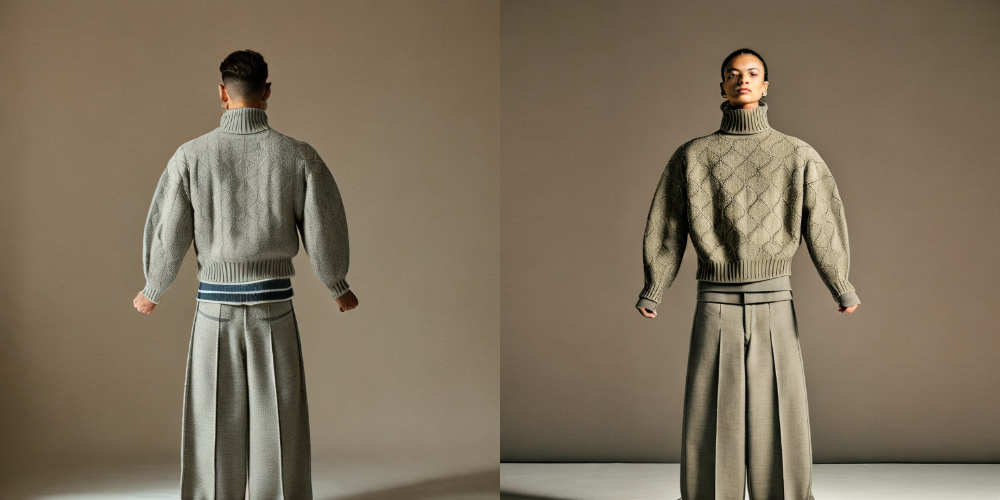

In [ ]:
#ControlNet Canny

prompt = "TR-GE textures and lighting. A large thick wool knit jumper with an intricate knitted pattern and a thick turtleneck. straight-leg cotton trousers." #@param {type:"string"}
negative_prompt = "non-photorealistic, boobs"               #@param {type:"string"}


num_samples = 2 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    images = pipe(prompt, image=edge_map, num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=7, controlnet_conditioning_scale=0.6, negative_prompt=negative_prompt).images
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_samples)
grid

  0%|          | 0/25 [00:00<?, ?it/s]

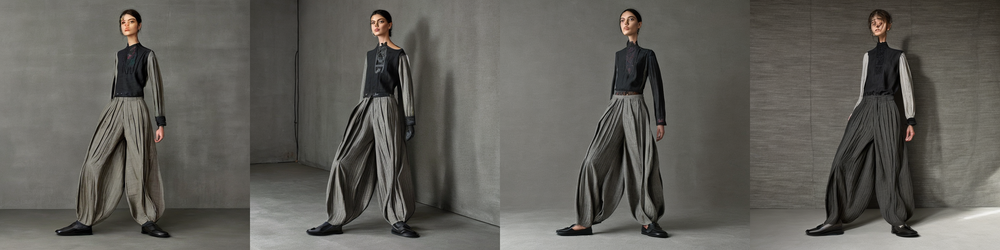

In [ ]:
#controlnet canny

prompt = "TR-GE textures and lighting. sharp shadows. charcoal colour linen top with vine leaf embroidery and baggy smooth black trousers with a few pleats. black loafers." #@param {type:"string"}

num_samples = 4 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    images = pipe(prompt, image=edge_map, num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=6, controlnet_conditioning_scale=0.8).images
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_samples)
grid

  0%|          | 0/25 [00:00<?, ?it/s]

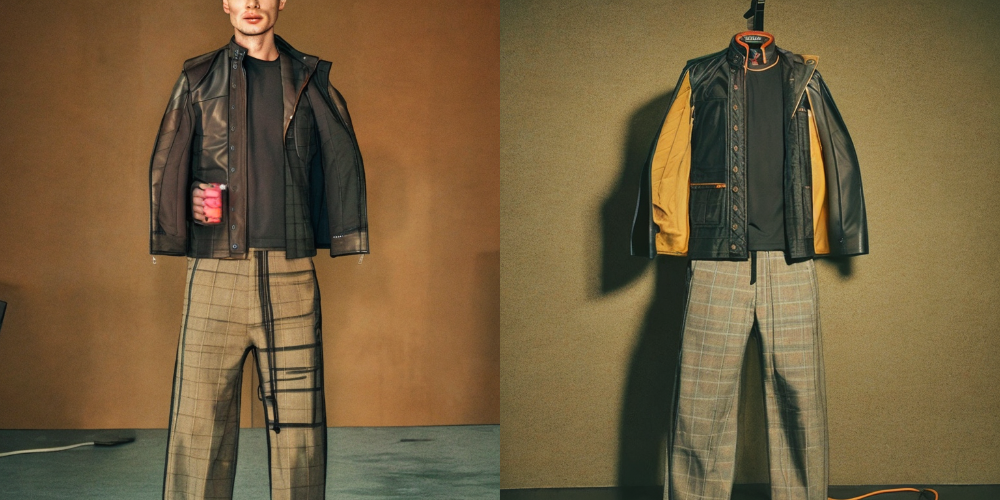

In [ ]:
#controlnet scribble

prompt = "TR-GE textures and lighting. black leather-jacket. cotton t-shirt. suit trousers." #@param {type:"string"}
negative_prompt = "leather-trousers, non-photorealistic, black and white"               #@param {type:"string"}


num_samples = 2 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    images = pipe(prompt, image=edge_map, num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=7, controlnet_conditioning_scale=0.6, negative_prompt=negative_prompt).images
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_samples)
grid

  0%|          | 0/25 [00:00<?, ?it/s]

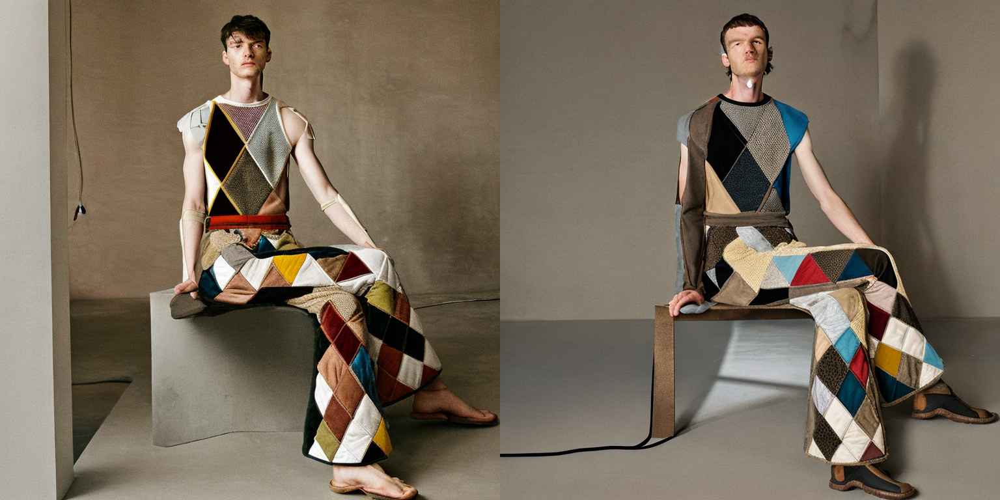

In [ ]:
#controlnet canny

prompt = "TR-GE textures and lighting. sitting on armchair. A patchwork t-shirt made of mixed lightweight materials. patchwork trousers made of mixed heavyweight materials. Multicoloured neutral palette diamond-shaped patchwork." #@param {type:"string"}
negative_prompt = "non-photorealistic, boobs, bright colours"               #@param {type:"string"}


num_samples = 2 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    images = pipe(prompt, image=edge_map, num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=7, controlnet_conditioning_scale=0.6, negative_prompt=negative_prompt).images
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_samples)
grid